<a href="https://colab.research.google.com/github/datascience-uniandes/eda-tutorial/blob/master/airbnb/eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploratory Data Analysis (EDA)

MINE-4101: Applied Data Science  
Univerisdad de los Andes  
  
**Dataset:** AirBnb Listings - Mexico City, Distrito Federal, Mexico [[dataset](http://insideairbnb.com/get-the-data/) | [dictionary](https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit?usp=sharing)]. This dataset comprises information about Airbnb property listings in Mexico City. It includes data points like neighborhood, property type, price per night, number of reviews, review scores, availability, amenities, and more.

**Business Context:** Property Investment and Vacation Rental Strategy. Imagine you're a consultant for individuals or firms looking to invest in properties for Airbnb rentals. They want to identify the most lucrative neighborhoods, optimal pricing strategies, and understand the factors that contribute to positive reviews and frequent bookings.

Last update: August, 2023

In [454]:
%pip install matplotlib ydata-profiling --q

In [455]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import numpy as np

In [456]:
#importar el dataset guardado en colab.
#from google.colab import drive
#drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 0. Carga de información

In [457]:
#se lee el archivo correspondiente a la ciudad de Berlin previamente descargado en el pc:
mca = pd.read_csv('../dataset/berlin.csv.gz')

In [458]:
# Pandas configuration for extending the number of columns and rows to show
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)

#1. Entendimiento inicial de los datos

#### El archivo seleccionado contiene 12472 registros y 75 columnas de información

In [459]:
mca.shape

(12472, 75)

In [460]:
mca.dtypes

id                                                int64
listing_url                                      object
scrape_id                                         int64
last_scraped                                     object
source                                           object
name                                             object
description                                      object
neighborhood_overview                            object
picture_url                                      object
host_id                                           int64
host_url                                         object
host_name                                        object
host_since                                       object
host_location                                    object
host_about                                       object
host_response_time                               object
host_response_rate                               object
host_acceptance_rate                            

Al revisar el diccionario se seleccionan variables que puedan tener informacón relevante:

name
description
neighborhood_overview
host_since
host_location
host_about
host_response_time
host_response_rate
host_acceptance_rate
host_is_superhost
host_listings_count
host_total_listings_count
host_has_profile_pic
host_identity_verified
neighbourhood
neighbourhood_cleansed
neighbourhood_group_cleansed
latitude
longitude
property_type
room_type
accommodates
bathrooms
bathrooms_text
bedrooms
beds
amenities
price
minimum_nights
maximum_nights
minimum_minimum_nights
maximum_minimum_nights
minimum_maximum_nights
maximum_maximum_nights
minimum_nights_avg_ntm
maximum_nights_avg_ntm
calendar_updated
has_availability
availability_30
availability_60
availability_90
availability_365
number_of_reviews
number_of_reviews_ltm
number_of_reviews_l30d
first_review
last_review
review_scores_rating
review_scores_accuracy
review_scores_cleanliness
review_scores_checkin
review_scores_communication
review_scores_location
review_scores_value
license
instant_bookable
reviews_per_month



Con esta información se genera un describe para compara la información.
se busca información donde puedan encontrarse valores nulos principalmente para eliminarlos del análisis

In [461]:
mca.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,1.247200e+04,1.247200e+04,1.247200e+04,12462.000000,12462.000000,12472.000000,12472.000000,12472.000000,0.0,7933.000000,12309.000000,12472.000000,12472.000000,12472.000000,12472.000000,1.247200e+04,1.247200e+04,12472.000000,1.247200e+04,0.0,12472.000000,12472.000000,12472.000000,12472.000000,12472.000000,12472.000000,12472.000000,10101.000000,9992.000000,9994.000000,9989.000000,9993.000000,9989.000000,9986.000000,12472.000000,12472.000000,12472.000000,12472.000000,10101.000000
mean,1.843407e+17,2.023062e+13,1.324328e+08,12.923768,14.440619,52.509825,13.402560,2.955500,NaN,1.481785,1.855472,44.695157,667.671905,44.530308,49.388550,5.173163e+05,1.033886e+06,48.579771,1.032713e+06,NaN,5.109686,13.180244,22.560055,117.180244,36.575609,9.580420,0.847338,4.680154,4.782519,4.662005,4.812269,4.810914,4.751988,4.629821,7.149615,6.010824,0.834349,0.226026,1.121521
std,3.265646e+17,0.000000e+00,1.543578e+08,63.555118,67.251155,0.033451,0.066462,1.884277,NaN,0.803784,1.530162,54.849129,497.064243,55.720214,66.014999,3.330331e+07,4.709233e+07,65.393601,4.703909e+07,NaN,8.632836,18.801588,29.487422,131.406602,78.560591,21.436469,1.842733,0.617374,0.373923,0.466180,0.364317,0.381268,0.354321,0.429965,22.376246,22.183389,2.978147,2.475181,1.858754
min,3.176000e+03,2.023062e+13,1.581000e+03,1.000000,1.000000,52.369040,13.107580,0.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00,1.000000,1.000000e+00,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.010000
25%,1.518332e+07,2.023062e+13,1.274679e+07,1.000000,1.000000,52.490267,13.363287,2.000000,NaN,1.000000,1.000000,2.000000,140.000000,2.000000,3.000000,3.650000e+02,3.650000e+02,2.100000,3.650000e+02,NaN,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,4.620000,4.730000,4.540000,4.770000,4.780000,4.670000,4.500000,1.000000,0.000000,0.000000,0.000000,0.120000
50%,3.434609e+07,2.023062e+13,5.274744e+07,1.000000,2.000000,52.509855,13.411470,2.000000,NaN,1.000000,1.000000,7.000000,1124.000000,6.000000,10.000000,1.125000e+03,1.125000e+03,7.000000,1.125000e+03,NaN,0.000000,2.000000,6.000000,52.000000,7.000000,1.000000,0.000000,4.840000,4.890000,4.800000,4.920000,4.930000,4.850000,4.720000,1.000000,1.000000,0.000000,0.000000,0.480000
75%,5.415847e+07,2.023062e+13,2.165418e+08,4.000000,5.000000,52.532335,13.438000,4.000000,NaN,2.000000,2.000000,92.000000,1125.000000,92.000000,92.000000,1.125000e+03,1.125000e+03,92.000000,1.125000e+03,NaN,6.000000,21.000000,41.000000,243.000000,33.000000,10.000000,1.000000,5.000000,5.000000,4.990000,5.000000,5.000000,5.000000,4.890000,3.000000,2.000000,1.000000,0.000000,1.530000
max,9.188887e+17,2.023062e+13,5.211785e+08,1126.000000,1359.000000,52.656110,13.721390,16.000000,NaN,12.000000,29.000000,1100.000000,9999.000000,1100.000000,1100.000000,2.147484e+09,2.147484e+09,1100.000000,2.147484e+09,NaN,30.000000,60.000000,90.000000,365.000000,2074.000000,764.000000,42.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,172.000000,172.000000,42.000000,38.000000,65.330000


In [462]:
mca['neighborhood_overview'].unique()

array(["The neighbourhood is famous for its variety of international eateries, pubs, restaurants, cafés, galleries and little shops.<br />The bakery next door is open everyday from up 7 am, which makes warm croissants for breakfast very tempting.<br /><br />On Sundays don't miss the traditional flea markets on Arkonaplatz and in the nearby Mauerpark for special treats and souvenirs. <br /><br /><br />check out our  travel guide and please let us know what your highlights were so we can add them for future guests",
       "Prenzlauer Berg is an amazing neighbourhood where the Bomème, artists, actors and the likes, of Eastern-Berlin used to live and the new one's live. Many nice coffee places, diverse restaurants and little parks and squares make it one of the most liveable neighbourhoods of the city, witnessed by the many families who live here.",
       nan, ...,
       'The flat is centrally located in Wedding, close to the Gesundbrunnencenter shopping centre and the Robert Koch Insti

In [463]:
#Cantidad de nulos por columna
mca.isna().sum()

id                                                  0
listing_url                                         0
scrape_id                                           0
last_scraped                                        0
source                                              0
name                                                0
description                                       146
neighborhood_overview                            5857
picture_url                                         0
host_id                                             0
host_url                                            0
host_name                                          10
host_since                                         10
host_location                                    1990
host_about                                       5894
host_response_time                               4882
host_response_rate                               4882
host_acceptance_rate                             4073
host_is_superhost           

In [464]:
#La columna 'bathrooms' no contiene información ni la columna 'calendar_updated'
print(mca['bathrooms'].unique())
print(mca['calendar_updated'].unique())

[nan]
[nan]


In [465]:
#verificación del campo neighbourhood
print(mca['neighbourhood'].unique())

['Berlin, Germany' nan 'Friedrichshain, Berlin, Germany'
 'Berlin Charlottenburg, Berlin, Germany' 'Berlin-Mitte, Berlin, Germany'
 'Berlin Neukölln , Berlin, Germany' 'Berlin, Mitte, Berlin, Germany'
 'Berlin - Mitte, Germany' 'Berlin, BE, Germany'
 'Berlin - Schöneberg, Berlin, Germany'
 'Berlin- Charlottenburg, Berlin, Germany'
 'Mitte/Tiergarten, Berlin, Germany' 'Berlin, schmargendorf, Germany'
 'berlin, Berlin, Germany' 'Berlin-Kreuzberg, Berlin, Germany'
 'Berlin Friedrichshain, Berlin, Germany' 'Berlin, Zehlendorf, Germany'
 'Berlín, Germany' 'Weissenhoher Strasse 14, Berlin, Germany'
 'Berlin, DE, Germany' 'Berlin, Be, Germany'
 'Hoppegarten, Brandenburg, Germany' 'Berlin, SN, Germany'
 'Weissensee, Berlin, Germany' 'Berlin, Berlín, Germany'
 'Berlin Prenzlauer Berg , Berlin, Germany' 'Berlin , Germany'
 'Mitte, Berlin, Germany' 'Schöneiche bei Berlin, Brandenburg, Germany'
 'Berlin, Spandau, Germany' 'Alt Treptow, Berlin, Germany'
 'Berlin,  Germany, Germany']


In [466]:
print(mca['neighbourhood_group_cleansed'].unique())
print(mca['bedrooms'].unique())

['Pankow' 'Friedrichshain-Kreuzberg' 'Neukölln' 'Mitte'
 'Charlottenburg-Wilm.' 'Tempelhof - Schöneberg' 'Treptow - Köpenick'
 'Steglitz - Zehlendorf' 'Lichtenberg' 'Marzahn - Hellersdorf' 'Spandau'
 'Reinickendorf']
[ 1.  4. nan  2.  5.  3.  6.  8.  7. 12.  9.]


Algunos campos no contienen información relevante (urls en general) o contienen demasiados campos nulos. estos campos no serán utilizados para realizar el análisis.

algunas otra se crean para validar si

In [467]:
filtered_ds = mca.drop(['id','host_listings_count','listing_url','scrape_id','last_scraped','source','picture_url','host_id','host_url','host_name','host_thumbnail_url','host_picture_url',
'host_neighbourhood','calendar_last_scraped', 'bathrooms', 'calendar_updated', 'neighbourhood', 'bedrooms', 'license', 'reviews_per_month','neighborhood_overview', 'host_location', 'host_about', 'description'], axis=1)

In [468]:
filtered_ds.shape

(12472, 51)

In [469]:
# Showing column types
filtered_ds.dtypes

name                                             object
host_since                                       object
host_response_time                               object
host_response_rate                               object
host_acceptance_rate                             object
host_is_superhost                                object
host_total_listings_count                       float64
host_verifications                               object
host_has_profile_pic                             object
host_identity_verified                           object
neighbourhood_cleansed                           object
neighbourhood_group_cleansed                     object
latitude                                        float64
longitude                                       float64
property_type                                    object
room_type                                        object
accommodates                                      int64
bathrooms_text                                  

In [470]:
#fifa_df.head() # Showing the first rows
#fifa_df.tail() # Showing last first rows
filtered_ds.sample(5) # Showing a sample of n rows

,name,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
12405,Rental unit in Berlin · ★New · 1 bedroom · 7 b...,2018-12-27,within an hour,100%,99%,t,5.0,"['email', 'phone']",t,t,Karl-Marx-Allee-Nord,Friedrichshain-Kreuzberg,52.521487,13.446156,Entire rental unit,Entire home/apt,7,1 bath,7.0,"[""Wifi"", ""Smoke alarm"", ""Refrigerator"", ""Iron""...",$190.00,2,365,2,7,14,365,2.0,359.4,t,16,46,76,343,1,1,1,2023-06-17,2023-06-17,5.00,5.00,5.00,5.00,5.00,5.00,3.00,t,5,5,0,0
5477,Condo in Berlin · ★5.0 · 1 bedroom · 1 bed · 1...,2018-09-24,NaN,NaN,NaN,f,1.0,"['email', 'phone']",t,t,Tiergarten Süd,Mitte,52.508440,13.347350,Entire condo,Entire home/apt,2,1 bath,1.0,"[""Wifi"", ""Smoke alarm"", ""Refrigerator"", ""Free ...",$95.00,92,1125,92,92,1125,1125,92.0,1125.0,t,29,59,89,364,15,0,0,2018-10-31,2021-11-18,5.00,5.00,5.00,5.00,5.00,4.93,4.80,f,1,1,0,0
6704,Rental unit in Berlin · ★4.87 · 1 bedroom · 1 ...,2019-08-07,within a few hours,100%,94%,t,1.0,"['email', 'phone']",t,t,Altglienicke,Treptow - Köpenick,52.416690,13.547660,Entire rental unit,Entire home/apt,2,1 bath,1.0,"[""Wifi"", ""Smoke alarm"", ""Refrigerator"", ""Coffe...",$58.00,3,1125,3,3,1125,1125,3.0,1125.0,t,0,8,18,279,85,21,1,2019-08-16,2023-06-17,4.87,4.91,4.69,4.98,4.99,4.76,4.87,f,1,1,0,0
7046,Rental unit in Berlin · 1 bedroom · 1 bed · 1 ...,2013-12-02,NaN,NaN,NaN,f,2.0,"['email', 'phone']",t,f,Alexanderplatz,Mitte,52.526140,13.404460,Entire rental unit,Entire home/apt,2,1 bath,1.0,"[""Hangers"", ""Kitchen"", ""First aid kit"", ""TV"", ...",$105.00,92,1125,92,92,1125,1125,92.0,1125.0,t,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0
8466,Serviced apartment in Berlin · ★4.78 · Studio ...,2019-08-29,within an hour,99%,99%,f,14.0,"['email', 'phone']",t,t,Schöneberg-Nord,Tempelhof - Schöneberg,52.500200,13.352730,Entire serviced apartment,Entire home/apt,2,1 bath,1.0,"[""Wifi"", ""Smoke alarm"", ""Safe"", ""Elevator"", ""S...",$137.00,1,1125,1,3,999,999,1.9,999.0,t,26,56,86,331,1705,495,19,2021-05-02,2023-06-14,4.78,4.83,4.85,4.85,4.81,4.81,4.65,t,8,8,0,0


In [471]:
#se hace un one_hot encoding de los 'amenities' para identificarlos

filtered_ds['amenities'] = filtered_ds['amenities'].str.lower()

filtered_ds['amenities'] = filtered_ds['amenities'].str.replace('[', ' ').str.replace(']','').str.replace(r'"[0-9]*\\"', '').str.replace(r'[A-z]*(\\u[1-9]*\S*.\S*.)\w+', '').str.replace(r'.+?(?=body\ssoap)', '').str.replace(r'.+?(?=refrigerator)', '').str.replace(r'.+?(?=shampoo)', '').str.replace(r'.+?(?=oven)', '').str.replace(r'.+?(?=sound\ssystem)', '').str.replace(r'.+?(?=conditioner)', '').str.replace(r'.+?(?=view)', '')
filtered_ds['amenities'] = filtered_ds['amenities'].str.split(',', expand=False).to_list()

# Step 2: Get unique categories and create one-hot encoding columns
unique_categories = set(category for categories in filtered_ds['amenities'] for category in categories)
for category in unique_categories:
    filtered_ds[category] = filtered_ds['amenities'].apply(lambda x: int(category in x))

# Drop the original 'Categories' column if needed
filtered_ds.drop(columns=['amenities'], inplace=True)

<ipython-input-471-da0d5d958a94>:5: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  filtered_ds['amenities'] = filtered_ds['amenities'].str.replace('[', ' ').str.replace(']','').str.replace(r'"[0-9]*\\"', '').str.replace(r'[A-z]*(\\u[1-9]*\S*.\S*.)\w+', '').str.replace(r'.+?(?=body\ssoap)', '').str.replace(r'.+?(?=refrigerator)', '').str.replace(r'.+?(?=shampoo)', '').str.replace(r'.+?(?=oven)', '').str.replace(r'.+?(?=sound\ssystem)', '').str.replace(r'.+?(?=conditioner)', '').str.replace(r'.+?(?=view)', '')
<ipython-input-471-da0d5d958a94>:5: FutureWarning: The default value of regex will change from True to False in a future version.
  filtered_ds['amenities'] = filtered_ds['amenities'].str.replace('[', ' ').str.replace(']','').str.replace(r'"[0-9]*\\"', '').str.replace(r'[A-z]*(\\u[1-9]*\S*.\S*.)\w+', '').str.replace(r'.+?(?=bod

In [472]:
#sin xx body soap ni refrigerator
filtered_ds.shape

(12472, 439)

In [473]:
spike_cols = [col for col in filtered_ds.columns if 'sound system' in col]
#print(list(filtered_ds.columns))
print(spike_cols)

['sound system with bluetooth and aux"', 'sound system with aux"', 'sound system"']


In [474]:
filtered_ds.columns.to_list()

['name',
 'host_since',
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate',
 'host_is_superhost',
 'host_total_listings_count',
 'host_verifications',
 'host_has_profile_pic',
 'host_identity_verified',
 'neighbourhood_cleansed',
 'neighbourhood_group_cleansed',
 'latitude',
 'longitude',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms_text',
 'beds',
 'price',
 'minimum_nights',
 'maximum_nights',
 'minimum_minimum_nights',
 'maximum_minimum_nights',
 'minimum_maximum_nights',
 'maximum_maximum_nights',
 'minimum_nights_avg_ntm',
 'maximum_nights_avg_ntm',
 'has_availability',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'number_of_reviews_l30d',
 'first_review',
 'last_review',
 'review_scores_rating',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_value',
 'i

#### De los distintos campos, los 5 que pueden tener más relevancia son:


*   room_type : se asume que el tipo de cuarto puede dar alguna información extra sobre la ocupación y el precio.
*   price: El precio permitirá identificar variaciones que se presenten y con esta información maximizar la posibilidad de alquiler. Este campo es necesario hacerle ajustes ya que se reconoció como una cadena de texto.
*   accomodates: puede ser un buen indicador del tamaño del inmueble a arrendar.
*   minimum nights: Se espera que los inmuebles con una menor cantidad de días mínimos tengan una mayor ocupación a lo largo del mes maximizando los ingresos.
*   review score rating: información acerca de qué tan bien se prestó el servicio.

Adicionalmente, el campo "neighbourhood_cleansed" puede brindar información adicional si se llega a encontrar un patrón por ubicación.


# 1.1 Análisis univariado

# Estrategia

Se buscará identificar los factores comunes que tengan los mejores inmuebles, ya sea por sus características o por sus ubicaciones geográficas.
inicialmente se revisarán las unidades de que poseen los distintos atributos y se realizarán ajustes deacuerdo a lo encontrado como se realizó con el precio (cadena a número). También se validarán posibles valores que se encuentren con errores de acuerdo al diccionario de datos.

Es importante agregar que el diccionario de datos es una herramienta fundamental porque permite identificar las unidades y los valores que deben de tener los distintos campos. Un pequeño preprocesamiento ya fue realizado para reducir la cantidad de variables a solamente aquellas que puedan aportar información valiosa al análisis.

También se buscarán correlaciones entre las variables cuantitativas y gráficos univariados/multivariados que permitan entender mejor el comportamiento de las variables presentes. Igualmente se realizará este análisis progresando desde un punto de vista general a uno particular donde se busca descubrir patrones ocultos que permitan obtener el mejor desempeño de una propiedad.

por último. se podrán generar campos calculados que brinden una mayor información sobre algunas variables del negocio.


In [475]:
# Se hace el ajuste de precios para convertirlo en enteros:
filtered_ds["price"].unique()
filtered_ds['price'] = pd.to_numeric(filtered_ds['price'].str.replace('$','').str.replace(',',''))
filtered_ds['price'].dtypes

<ipython-input-475-785939cc0868>:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  filtered_ds['price'] = pd.to_numeric(filtered_ds['price'].str.replace('$','').str.replace(',',''))


dtype('float64')

[]

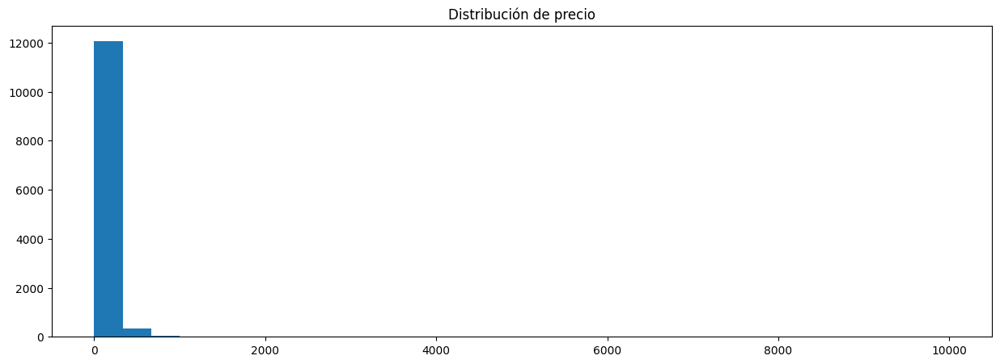

In [476]:
# histograma de precio
plt.figure(figsize=(15, 5))
plt.hist(filtered_ds["price"], bins=30)
plt.title("Distribución de precio")
plt.plot()

Este histograma demuestra que la mayoria de los valores se encuentran entre 1 y 1000 euros, sin embargo no nos muestra la distribución exacta por outliers

In [477]:
# Let's make some calculations for determining an outlier threshold
q1 = filtered_ds["price"].quantile(0.25)
q3 = filtered_ds["price"].quantile(0.75)
iqr = q3 - q1

[]

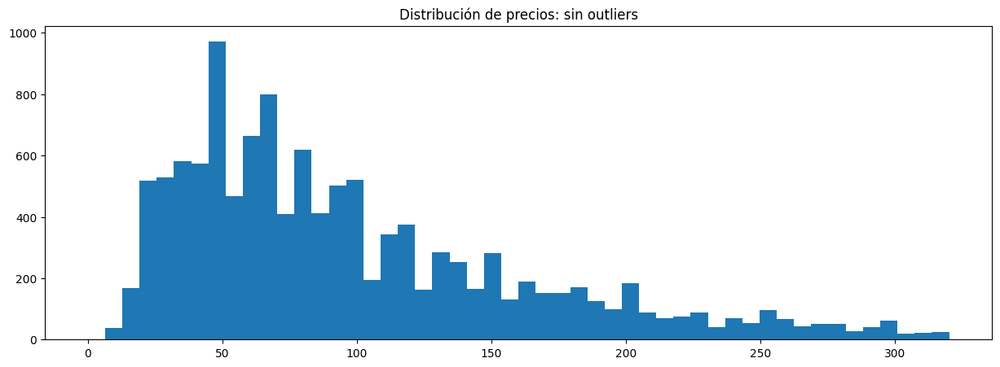

In [478]:
plt.figure(figsize=(15, 5))
plt.hist(filtered_ds.loc[filtered_ds["price"] <= (q3 + 2 * iqr)]["price"], bins=50)
plt.title("Distribución de precios: sin outliers")
plt.plot()

In [479]:
filtered_ds['price'].describe()

count    12472.000000
mean       115.166774
std        195.676946
min          0.000000
25%         50.000000
50%         81.000000
75%        140.000000
max       9999.000000
Name: price, dtype: float64

In [480]:
# Showing the number of unique values of listing ids
# This can be helpful to diagnose duplicity
print(filtered_ds["room_type"].nunique())
print(filtered_ds["room_type"].unique())

4
['Entire home/apt' 'Private room' 'Shared room' 'Hotel room']


In [481]:
# Calculating the relative frecuency of room types
filtered_ds["room_type"].value_counts(dropna=False, normalize=True)

Entire home/apt    0.653063
Private room       0.323044
Shared room        0.012989
Hotel room         0.010904
Name: room_type, dtype: float64

Text(0, 0.5, 'Propiedades')

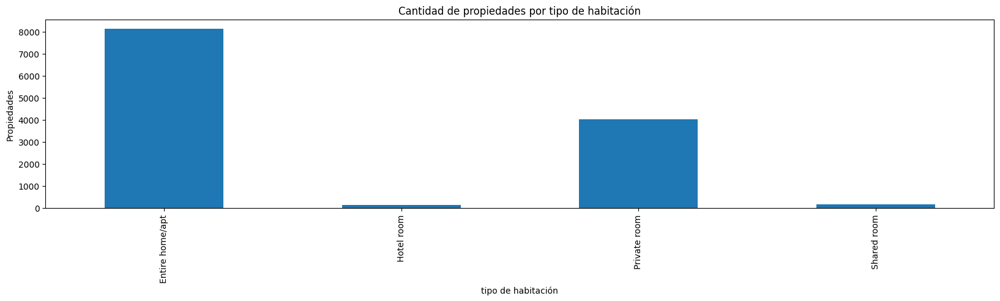

In [482]:
ax = filtered_ds.groupby('room_type')['price'].count().plot.bar()
ax.set_title("Cantidad de propiedades por tipo de habitación")
ax.set_xlabel("tipo de habitación")
ax.set_ylabel("Propiedades")


In [483]:
filtered_ds["accommodates"].value_counts(dropna=False, normalize=True)

2     0.486770
4     0.170141
1     0.106078
3     0.104875
6     0.050032
5     0.042656
8     0.013069
7     0.010022
10    0.003768
12    0.003127
9     0.003047
16    0.002566
14    0.001283
11    0.001123
13    0.000962
15    0.000401
0     0.000080
Name: accommodates, dtype: float64

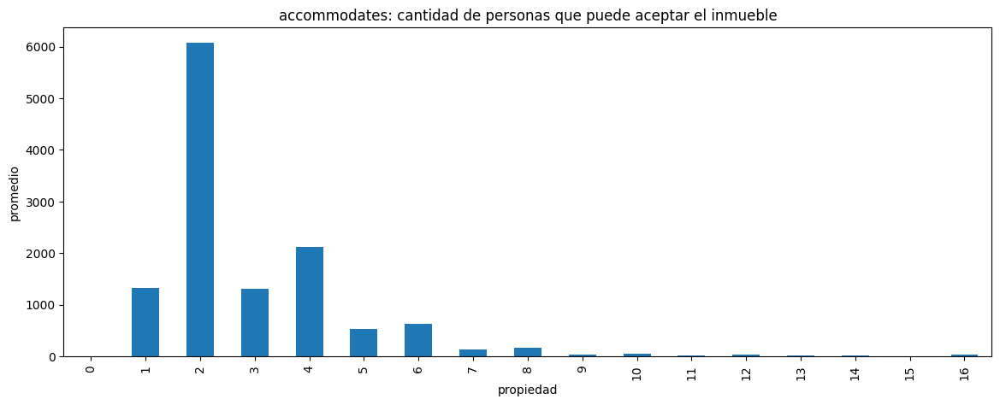

In [484]:
plt.figure(figsize=(14, 5))
ax = filtered_ds.groupby('accommodates')['accommodates'].count().plot.bar()
ax.set_title("accommodates: cantidad de personas que puede aceptar el inmueble")
ax.set_xlabel("propiedad")
ax.set_ylabel("promedio")

plt.show()

In [485]:
filtered_ds['minimum_nights'].describe()

count    12472.000000
mean        44.695157
std         54.849129
min          1.000000
25%          2.000000
50%          7.000000
75%         92.000000
max       1100.000000
Name: minimum_nights, dtype: float64

In [486]:
439-51

388

In [487]:
amenities = filtered_ds.iloc[:, -388:]
sums = amenities.sum()
sums_df = pd.DataFrame({'amenities': sums.index, 'sum': sums.values})

sums_df = sums_df.sort_values(by='sum', ascending=False)

print(sums_df)

                                         amenities   sum
103                                       "washer"  6940
309                                   "bed linens"  5653
174                                       shampoo"  5270
134                                      "heating"  4633
124                                   "essentials"  4522
..                                             ...   ...
256              "paid parking garage on premises"     1
255      "gorenje stainless steel induction stove"     1
254               "public or shared beach access "     1
100                            "hdtv with fire tv"     1
0     "alpes inox stainless steel induction stove"     1

[388 rows x 2 columns]


In [488]:
sums_df['sum']= sums_df['sum']/12472

In [489]:
princ_amenities = sums_df.amenities.head(50).to_list()

<function matplotlib.pyplot.show(close=None, block=None)>

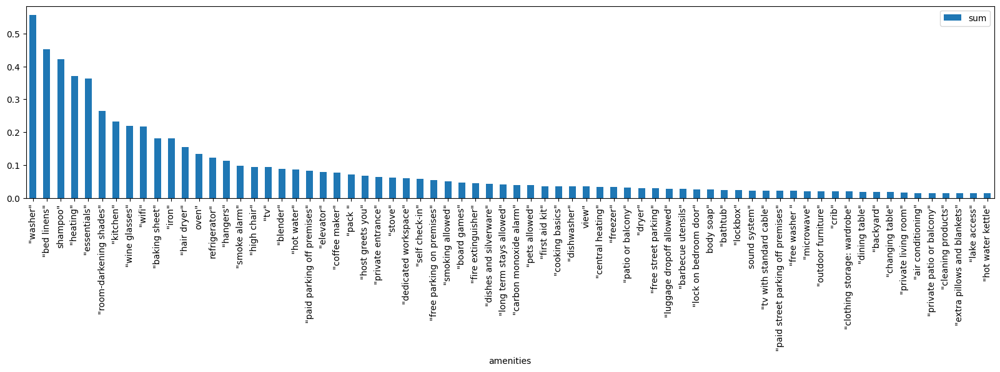

In [490]:
ax = sums_df.head(70).plot.bar(x='amenities', y='sum', rot=0)
for tick in ax.get_xticklabels():
    tick.set_rotation(90)

plt.rcParams['figure.figsize'] = [20, 4]
plt.show

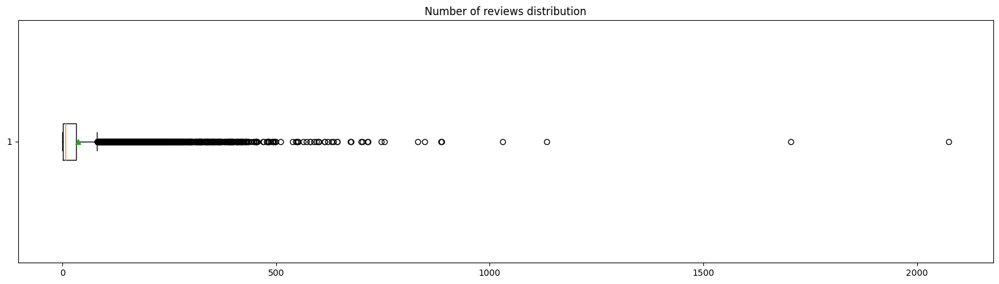

In [491]:
# boxplot
plt.figure(figsize=(20, 5))
plt.boxplot(filtered_ds["number_of_reviews"], showmeans=True, vert=False)
plt.title("Number of reviews distribution")
plt.show()

Se revisan las variables de disponibilidad.



In [492]:
filtered_ds['availability_60'].describe()

count    12472.000000
mean        13.180244
std         18.801588
min          0.000000
25%          0.000000
50%          2.000000
75%         21.000000
max         60.000000
Name: availability_60, dtype: float64

In [493]:
filtered_ds.groupby('availability_365')['availability_60'].count()

availability_365
0      4517
1       103
2        83
3        63
4        81
       ... 
361      15
362      42
363      52
364     102
365     246
Name: availability_60, Length: 366, dtype: int64

Existen 4517 inmuebles que no tienen disponibilidad en los próximos 365 días. Al no tener un experto de negocio para preguntar si este comportamiento es normal y válido, se relaizarán 2 análisis iguales teniendo en cuenta estos usuarios y eliminandolos.


Se crea un campo con el ingreso que perciben los inmuebles \anualmente.

In [494]:
filtered_ds['revenue'] = (365-filtered_ds['availability_365'])*filtered_ds['price']

[]

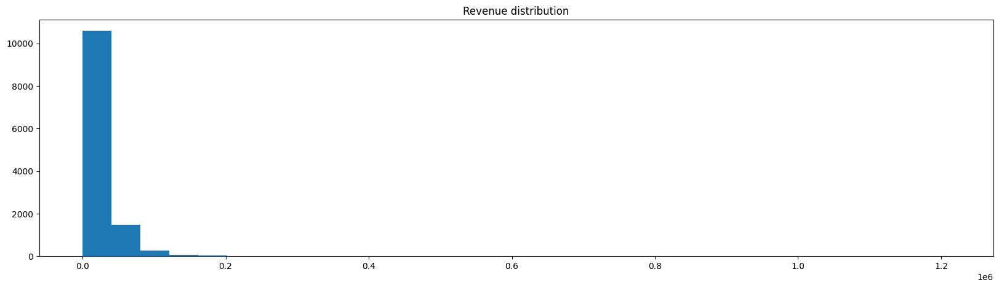

In [495]:
# histograma de precio
plt.figure(figsize=(20, 5))
plt.hist(filtered_ds["revenue"], bins=30)
plt.title("Revenue distribution")
plt.plot()

[]

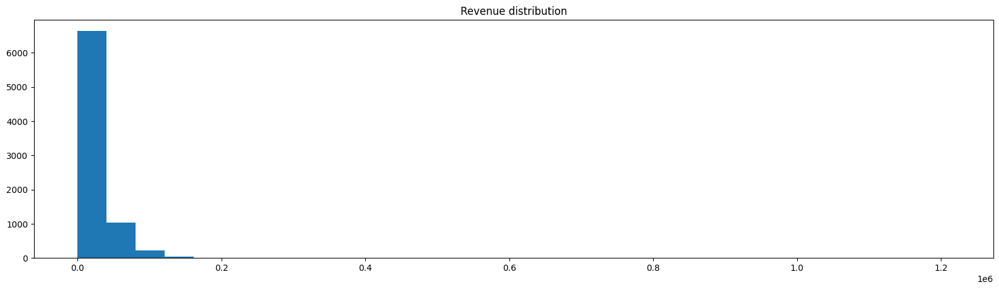

In [496]:
# histograma de revenue sin los usuarios sin disponibilidad

plt.figure(figsize=(20, 5))
plt.hist(filtered_ds.loc[(filtered_ds['availability_365'] > 0)&(filtered_ds['price'] > 0),['revenue']], bins=30)
plt.title("Revenue distribution")
plt.plot()

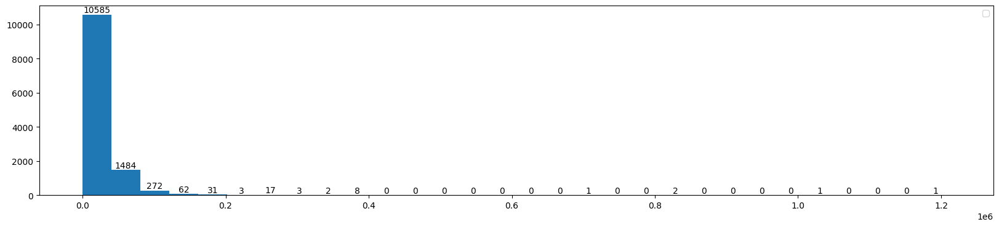

In [497]:
freq, bins, patches = plt.hist(filtered_ds["revenue"], bins=30)

# x coordinate for labels
bin_centers = np.diff(bins)*0.5 + bins[:-1]

n = 0
for fr, x, patch in zip(freq, bin_centers, patches):
  height = int(freq[n])
  plt.annotate("{}".format(height),
               xy = (x, height),             # top left corner of the histogram bar
               xytext = (0,0.2),             # offsetting label position above its bar
               textcoords = "offset points", # Offset (in points) from the *xy* value
               ha = 'center', va = 'bottom'
               )
  n = n+1


plt.legend()
plt.show;

In [548]:
filtered_ds.loc[(filtered_ds['availability_365'] >= 0)&(filtered_ds['price'] > 0),['revenue']].describe()

,revenue
count,1.247000e+04
mean,2.440590e+04
std,3.219831e+04
min,0.000000e+00
25%,9.125000e+03
50%,1.730950e+04
75%,3.066000e+04
max,1.212202e+06


In [549]:
filtered_ds.loc[(filtered_ds['availability_365'] >= 0)&(filtered_ds['price'] > 0) &(filtered_ds['revenue'] == 0),['revenue', 'price','availability_365', 'availability_90', 'availability_60' ]].head(2)

,revenue,price,availability_365,availability_90,availability_60
188,0.0,90.0,365,90,60
232,0.0,20.0,365,90,60


[]

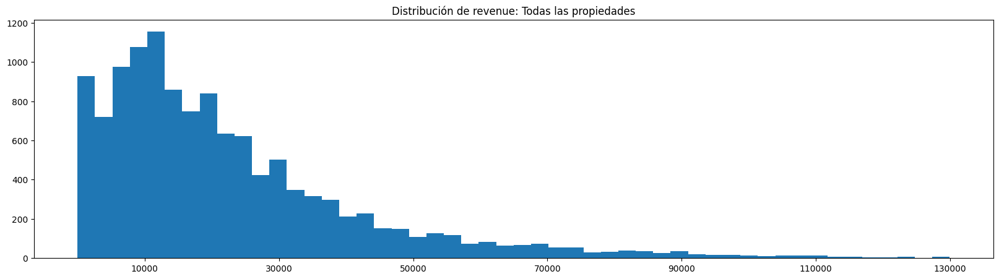

In [500]:
# Let's make some calculations for determining an outlier threshold
q1 = filtered_ds["revenue"].quantile(0.25)
q3 = filtered_ds["revenue"].quantile(0.75)
iqr2 = q3 - q1


plt.figure(figsize=(20, 5))
plt.hist(filtered_ds.loc[filtered_ds["revenue"] <= 130000]["revenue"], bins=50)
plt.title("Distribución de revenue: Todas las propiedades")

plt.xticks(
    ticks=[
        10000,
        30000,
        50000,
        70000,
        90000,
        110000,
        130000,
        150000
    ],
)
plt.plot()

[]

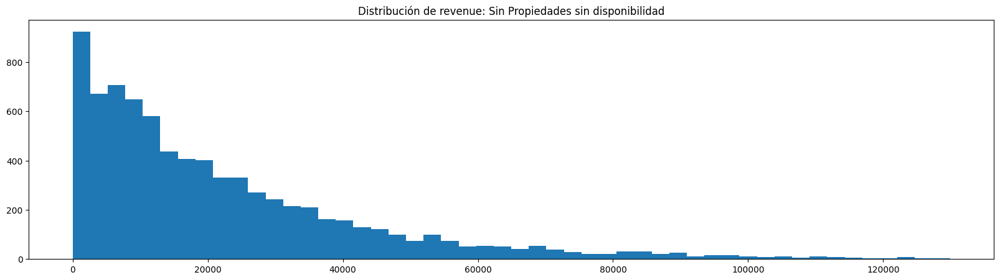

In [501]:

plt.figure(figsize=(20, 5))
plt.hist(filtered_ds.loc[(filtered_ds['availability_365'] > 0) &(filtered_ds['revenue'] < 130000),['revenue']], bins=50)
plt.title("Distribución de revenue: Sin Propiedades sin disponibilidad")

plt.plot()

In [545]:
filtered_ds.loc[(filtered_ds['availability_365'] >= 0) ,['revenue']].describe(percentiles= [.25,.5,.75,.9,.95])

,revenue
count,1.247200e+04
mean,2.440199e+04
std,3.219721e+04
min,0.000000e+00
25%,9.125000e+03
50%,1.730000e+04
75%,3.066000e+04
90%,5.040000e+04
95%,6.859450e+04
max,1.212202e+06


## 2. Bivariate analysis

In [503]:
filtered_ds.dtypes

name                                       object
host_since                                 object
host_response_time                         object
host_response_rate                         object
host_acceptance_rate                       object
                                           ...   
 disney+"                                   int64
 "aeg stainless steel induction stove"      int64
  tv with apple tv"                         int64
 "coffee maker: espresso machine"           int64
revenue                                   float64
Length: 440, dtype: object

In [529]:
columns_to_sum

[' "exercise equipment: free weights"',
 ' "alpes inox stainless steel induction stove"',
 ' "extra pillows and blankets"',
 ' "standalone high chair - always at the listing"',
 ' "resort access"',
 ' "lock on bedroom door"',
 ' "blaupunkt  induction stove"',
 ' open specific hours',
 ' "hot water"',
 ' "bosch stainless steel induction stove"',
 ' "hangers"',
 ' "booster seat high chair - always at the listing"',
 ' "clothing storage: walk-in closet"',
 ' "pets allowed"',
 ' "clothing storage"',
 ' "private outdoor pool - heated"',
 ' "tv with apple tv"',
 ' "hdtv with chromecast',
 ' "dryer"',
 ' "miele  induction stove"',
 ' "shared backyard "',
 '  hdtv"',
 ' "house bikes"',
 ' "bbq grill: charcoal"',
 ' " toys for ages 2-5 years old',
 ' "gorenje electric stove"',
 ' "coffee maker"',
 ' standard cable',
 ' open 24 hours"',
 ' "induction stove"',
 ' "pool"',
 '  tv with standard cable"',
 ' "backyard"',
 ' "bikes"',
 ' roku',
 ' "hot tub"',
 ' "clothing storage: wardrobe and dresser

In [530]:

columns_to_sum = filtered_ds.iloc[:, -393:-3].columns.to_list()


filtered_ds['tot_amenities'] = filtered_ds[columns_to_sum].sum(axis=1)-filtered_ds['revenue']

filtered_ds.head()

,name,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,"""exercise equipment: free weights""","""alpes inox stainless steel induction stove""","""extra pillows and blankets""","""standalone high chair - always at the listing""","""resort access""","""lock on bedroom door""","""blaupunkt induction stove""",open specific hours,"""hot water""","""bosch stainless steel induction stove""","""hangers""","""booster seat high chair - always at the listing""","""clothing storage: walk-in closet""","""pets allowed""","""clothing storage""","""private outdoor pool - heated""","""tv with apple tv""","""hdtv with chromecast","""dryer""","""miele induction stove""","""shared backyard ""","hdtv""","""house bikes""","""bbq grill: charcoal""",""" toys for ages 2-5 years old","""gorenje electric stove""","""coffee maker""",standard cable,"open 24 hours""","""induction stove""","""pool""","tv with standard cable""","""backyard""","""bikes""",roku,"""hot tub""","""clothing storage: wardrobe and dresser""","""free parking on premises""","""safe""","""private gym in building""","""bread maker""","""wine glasses""","""trash compactor""","""naff gas stove""","""game console: xbox series x""","""bbq grill""","""cooking basics""","""central air conditioning""","""clothing storage: walk-in closet and dresser""","""brastemp induction stove""","""hdtv with disney+","""tv with apple tv","""tv with amazon prime video","""laundry services""","""indoor fireplace""",,"""exercise equipment""","""paid dryer""",espresso machine,"""changing table - always at the listing""","""hdtv with apple tv","pour-over coffee""","premium cable""","""free street parking""","hbo max""",dvd player,"""breakfast buffet available person per day""","""hdtv with standard cable""",hdtv with roku,"""long term stays allowed""","""tv with netflix","fire tv""",""" toys""","""crib - always at the listing""","""hdtv with standard cable","""amica electric stove""","""game room""","""hot water kettle""","""shared indoor pool - available all year","tv""",hdtv with apple tv,"""paid parking on premises""","""barbecue utensils""","""drying rack for clothing""","""juno stove""","""exercise equipment: stationary bike""","""brastemp stainless steel electric stove""","""outdoor shower""","""private sauna""","""coffee maker: french press""","""standalone high chair - available upon request""","netflix""","yoga mat""","""siemens electric stove""","and 10+ years old""","""shared hot tub""","""kitchen""","""crib""","""whirlpool stove""","""paid crib - available upon request""","""pool table""","""hdtv with fire tv""","""luggage dropoff allowed""","""free carport on premises""","""washer""","""paid washer""","""coffee maker: espresso machine","""private backyard ""","""coffee maker: drip coffee maker","french press""","""shared patio or balcony""","""tv with premium cable""","""electric stove""","""portable air conditioning""","""rice maker""","keurig coffee machine""","""exercise equipment: treadmill","""stainless steel induction stove""","""game console: ps3""","""coffee maker: 

In [531]:
numeric_cols = filtered_ds.iloc[:, 0:50].select_dtypes(include=['int', 'float']).columns.tolist()
numeric_cols.append('revenue')
numeric_cols.append('tot_amenities')

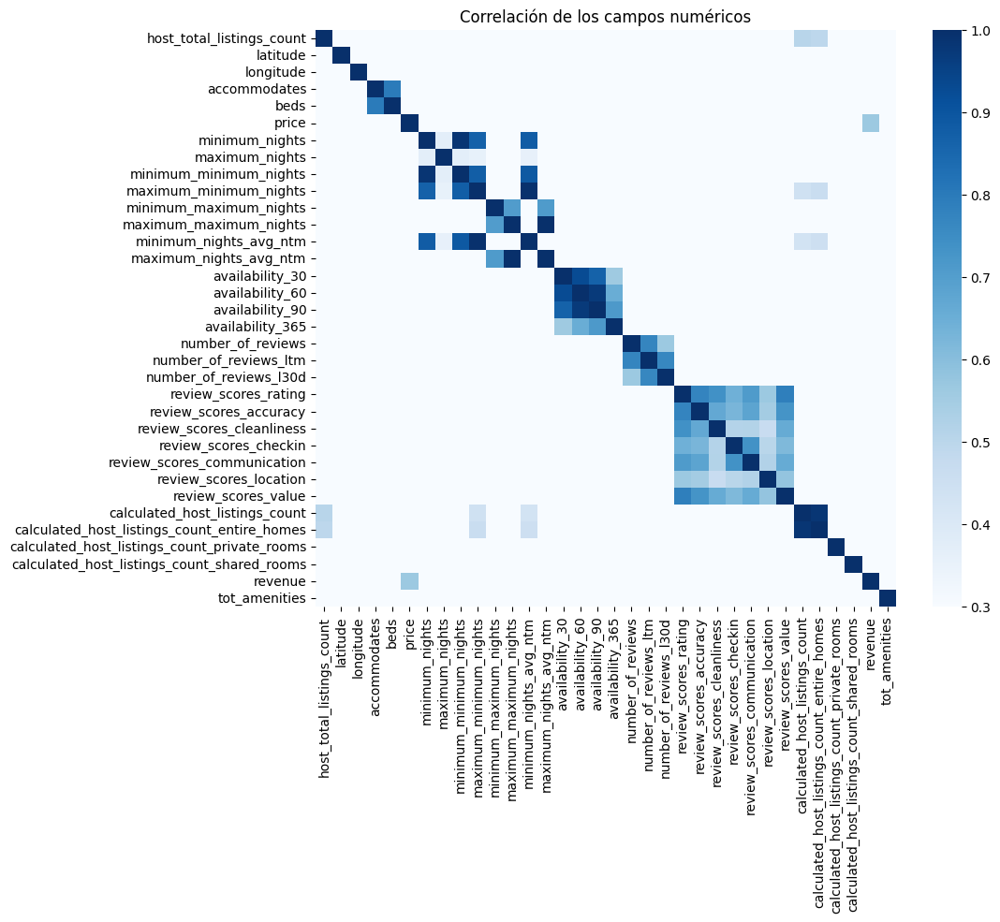

In [532]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    filtered_ds[numeric_cols].corr(),
    vmin=0.3, vmax=1,
    cmap="Blues"
)
plt.title("Correlación de los campos numéricos")
plt.show()

Existen algunas relaciones entre las metricas de reviews (numero de reviews en los últimos 30 días, último mes y cálculo de reviews.), disponibilidades, cantidad de camas y número de gente que puede acoger. Estos no revelan nueva información que no se esperara.


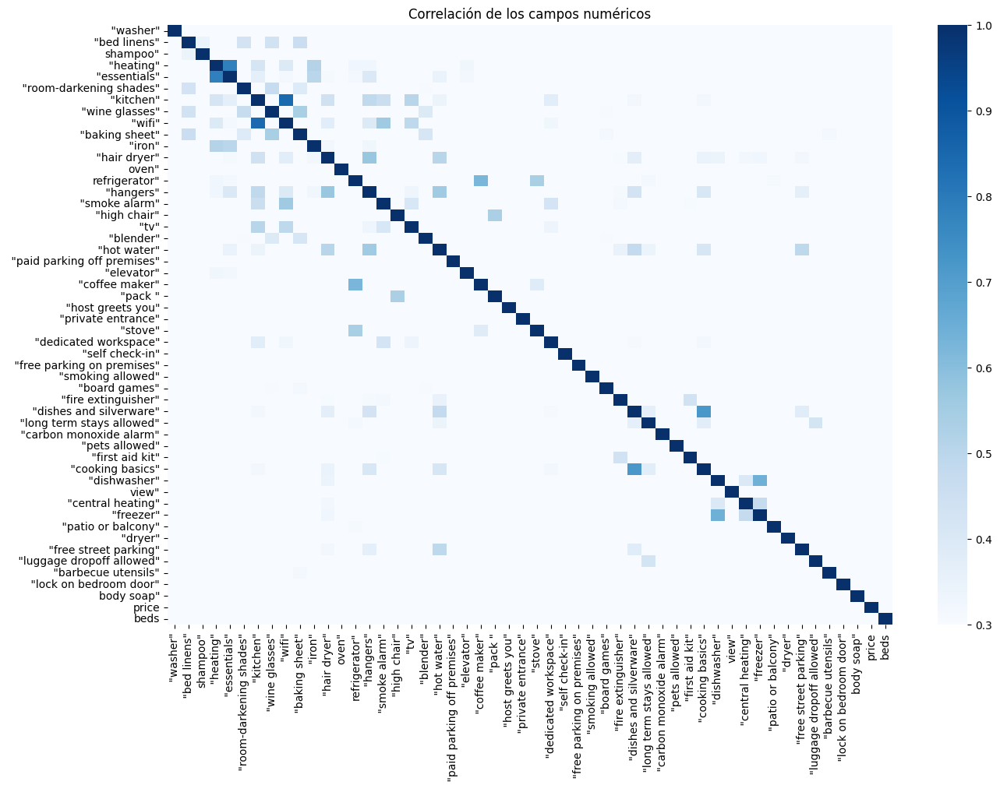

In [506]:
#se comparan los 'amenities' principales y se agrega el precio para ver si hay relación
princ_amenities.append("price")
princ_amenities.append("beds")
# Correlation heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(
    filtered_ds[princ_amenities].corr(),
    vmin=0.3, vmax=1,
    cmap="Blues"
)
plt.title("Correlación de los campos de amenities")
plt.show()

Se calcula la ubicación de los inmuebles entre el 75% y 95% más alto de revenue

In [546]:
value_ranges = [0, 9125, 17300, 30660, 50400, 500000]  # valores de rango
labels = ['blue', 'green', 'orange', 'red', 'purple']  # labels finales

filtered_ds['Category'] = pd.cut(filtered_ds['revenue'], bins=value_ranges, labels=labels, right=False)
"""
25% 	9.125000e+03
50% 	1.730000e+04
75% 	3.066000e+04
90% 	5.040000e+04
95% 	6.859450e+04
"""

'\n25% \t9.125000e+03\n50% \t1.730000e+04\n75% \t3.066000e+04\n90% \t5.040000e+04\n95% \t6.859450e+04\n'

In [547]:
#folium para mapas
import folium

map=folium.Map(location=[52.5,13.4], zoom_start =11)

list_coor=filtered_ds.loc[(filtered_ds['availability_365'] >= 0) , ['name', 'latitude', 'longitude','Category']].sample(3000)
#list_coor=list_coor.replace({"Localidad": dic})
list_coor= list_coor.values.tolist()

for i in list_coor:

    """map.add_child(folium.Marker(location=[i[1],i[2]],popup=i[0],icon=folium.Icon(str(i[3]))))
    """
    map.add_child(folium.Circle(radius = 20,location=[i[1],i[2]],
                                popup=i[0],color=str(i[3])))
map

No se ve Claramente una distribución espacial de los inmuebles a partir del revenue. Sin embargo, si es notable que la cantidad de inmuebles con un revenue más alto es mayor en el centro de la ciudad y menor en las zonas exteriores.
Se realiza un gráfico similar con el precio por noche para comparar.

In [551]:
filtered_ds.loc[(filtered_ds['availability_365'] >= 0), ['price']].describe(percentiles= [.25,.5,.75,.9,.95])

,price
count,12472.000000
mean,115.166774
std,195.676946
min,0.000000
25%,50.000000
50%,81.000000
75%,140.000000
90%,219.900000
95%,284.000000
max,9999.000000


In [552]:
value_ranges2 = [0, 50, 81, 140, 219.9, 10000]  # valores de rango
labels = ['gray', 'blue', 'orange', 'red','purple']  # labels finales

filtered_ds['category_price'] = pd.cut(filtered_ds['price'], bins=value_ranges2, labels=labels, right=False)


In [554]:

map2=folium.Map(location=[52.5,13.4], zoom_start =11)


list_coor=filtered_ds.loc[(filtered_ds['availability_365'] >= 0) , ['name', 'latitude', 'longitude','category_price']].sample(3000)
#list_coor=list_coor.replace({"Localidad": dic})
list_coor= list_coor.values.tolist()

for i in list_coor:

    """map.add_child(folium.Marker(location=[i[1],i[2]],popup=i[0],icon=folium.Icon(str(i[3]))))
    """
    map2.add_child(folium.Circle(radius = 20,location=[i[1],i[2]],
                                popup=i[0],color=str(i[3])))
map2

Parece existir una distribución por barrios. Se hace el análsis del promedio por barrio

<Axes: xlabel='neighbourhood_cleansed'>

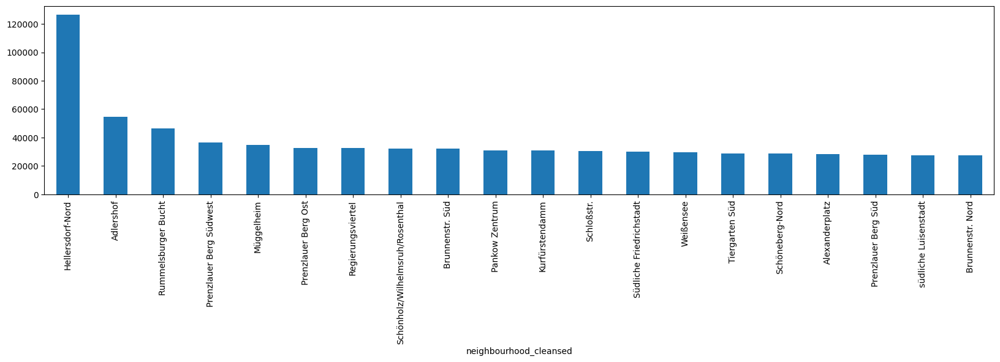

In [544]:
filtered_ds.groupby('neighbourhood_cleansed')['revenue'].mean().sort_values(ascending=False)[0:20].plot.bar()

<Axes: xlabel='neighbourhood_cleansed'>

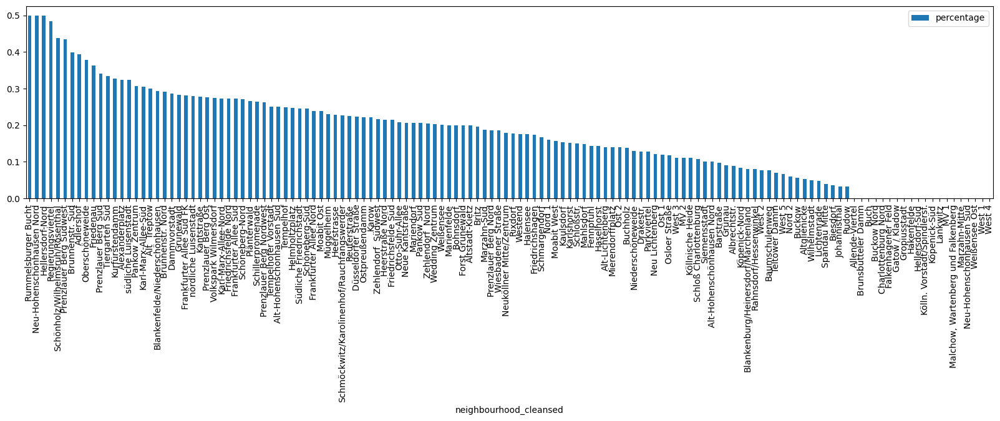

In [561]:
filter_val = filtered_ds[filtered_ds['revenue'] > 30660]

barrios_pcnt = filter_val.groupby('neighbourhood_cleansed').size() / filtered_ds.groupby('neighbourhood_cleansed').size()

barrios_pcnt= barrios_pcnt.reset_index()
barrios_pcnt.columns = ['neighbourhood_cleansed', 'percentage']
barrios_pcnt.sort_values(by = 'percentage', ascending=False).plot.bar( x= 'neighbourhood_cleansed')

<Axes: xlabel='neighbourhood_cleansed'>

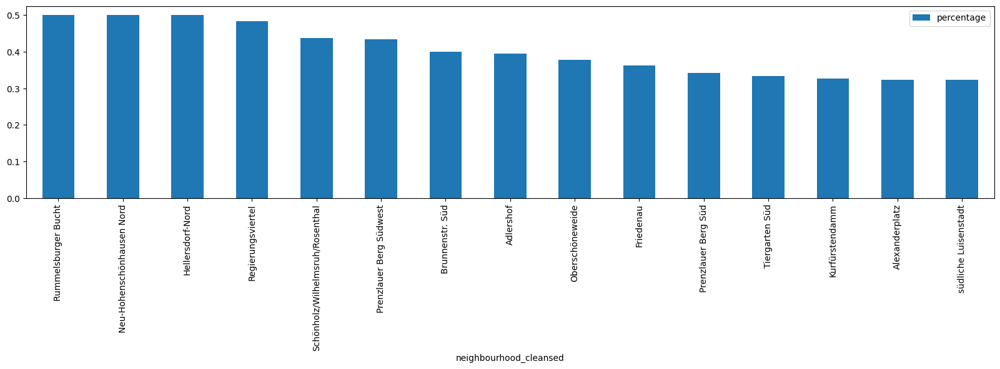

In [567]:
barrios_pcnt.sort_values(by = 'percentage', ascending=False).head(15).plot.bar( x= 'neighbourhood_cleansed')

In [560]:
barrios_pcnt['neighbourhood_cleansed'].nunique()

136

In [576]:
barrios_pcnt.sort_values(by = 'percentage', ascending=False)['neighbourhood_cleansed'].to_list()[0:15]

['Rummelsburger Bucht',
 'Neu-Hohenschönhausen Nord',
 'Hellersdorf-Nord',
 'Regierungsviertel',
 'Schönholz/Wilhelmsruh/Rosenthal',
 'Prenzlauer Berg Südwest',
 'Brunnenstr. Süd',
 'Adlershof',
 'Oberschöneweide',
 'Friedenau',
 'Prenzlauer Berg Süd',
 'Tiergarten Süd',
 'Kurfürstendamm',
 'Alexanderplatz',
 'südliche Luisenstadt']

In [577]:
barrios = barrios_pcnt.sort_values(by = 'percentage', ascending=False)['neighbourhood_cleansed'].to_list()[0:15]

In [578]:

map3=folium.Map(location=[52.5,13.4], zoom_start =11)

list_coor=filtered_ds.loc[(filtered_ds['availability_365'] >= 0) & (filtered_ds['neighbourhood_cleansed'].isin(barrios)) , ['neighbourhood_cleansed', 'latitude', 'longitude','Category']]
list_coor= list_coor.values.tolist()

#Hellersdorf-Nord

for i in list_coor:

    """map.add_child(folium.Marker(location=[i[1],i[2]],popup=i[0],icon=folium.Icon(str(i[3]))))
    """
    map3.add_child(folium.Circle(radius = 20,location=[i[1],i[2]],
                                popup=i[0],color=str(i[3])))



map3

Servicios (Amenities) presentes en los inmuebles de los barrios con revenue alto:

In [515]:
barrios_df = filtered_ds[(filtered_ds['neighbourhood_cleansed'].isin(barrios)) & (filtered_ds['revenue']>31320)]
barrios_df.shape

(302, 442)

302 inmuebles de alto revenue (>75% de la muestra)

In [516]:
amenities = barrios_df.iloc[:, -389:]
amenities.drop(['revenue'], axis=1, inplace=True)
sums = amenities.sum()
sums_df = pd.DataFrame({'amenities': sums.index, 'sum': sums.values})

sums_df = sums_df.sort_values(by='sum', ascending=False)
sums_df = sums_df[sums_df['sum']>0]

print(sums_df)

                        amenities  sum
307                  "bed linens"  178
172                      shampoo"  148
101                      "washer"  143
229       "room-darkening shades"  135
38                 "wine glasses"   87
..                            ...  ...
350     "blodgett electric stove"    1
135   "clothing storage: dresser"    1
109              "electric stove"    1
301                     "hammock"    1
360                        "hdtv"    1

[155 rows x 2 columns]


<ipython-input-516-0ecc37151784>:3: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  sums = amenities.sum()


<function matplotlib.pyplot.show(close=None, block=None)>

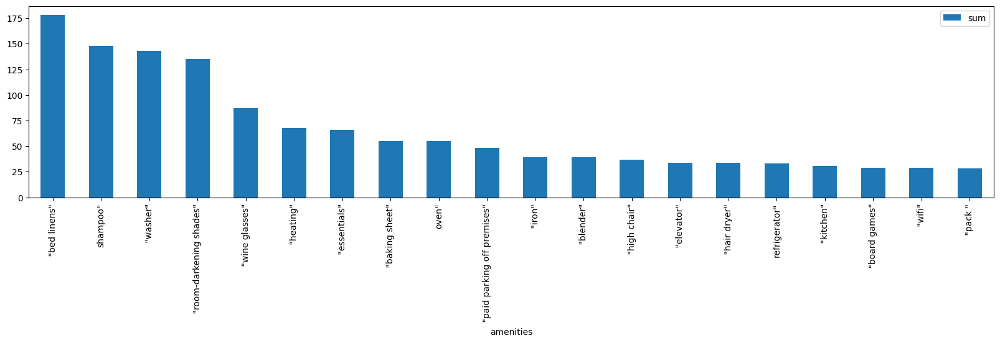

In [579]:
ax = sums_df.head(20).plot.bar(x='amenities', y='sum', rot=0)
for tick in ax.get_xticklabels():
    tick.set_rotation(90)

plt.rcParams['figure.figsize'] = [20, 4]
plt.show

In [581]:
sums_df.head(20)['amenities'].to_list()

[' "bed linens"',
 'shampoo"',
 ' "washer"',
 ' "room-darkening shades"',
 ' "wine glasses"',
 ' "heating"',
 ' "essentials"',
 ' "baking sheet"',
 'oven"',
 ' "paid parking off premises"',
 ' "iron"',
 ' "blender"',
 ' "high chair"',
 ' "elevator"',
 ' "hair dryer"',
 'refrigerator"',
 ' "kitchen"',
 ' "board games"',
 ' "wifi"',
 ' "pack "']

Si bien es mayor la cantidad de propiedades que se arriendan completas (+14%) vs la cantidad general, también existen cuartos individuales o compartidos.

In [570]:
barrios_df["room_type"].value_counts(dropna=False, normalize=True)

Entire home/apt    0.794702
Private room       0.125828
Shared room        0.049669
Hotel room         0.029801
Name: room_type, dtype: float64

<function matplotlib.pyplot.show(close=None, block=None)>

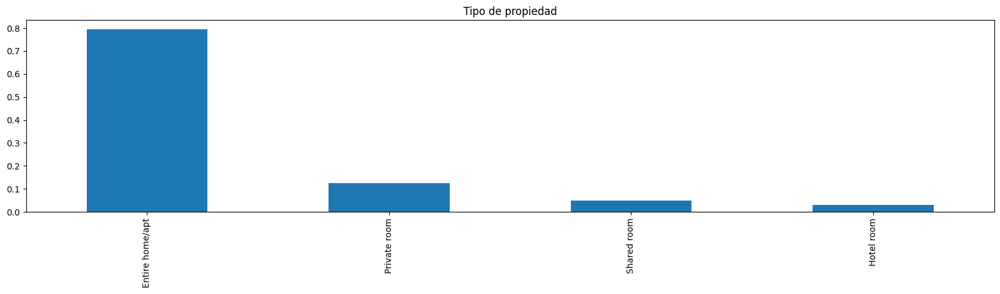

In [572]:
barrios_df["room_type"].value_counts(dropna=False, normalize=True).plot.bar()
plt.title("Tipo de propiedad")
plt.show

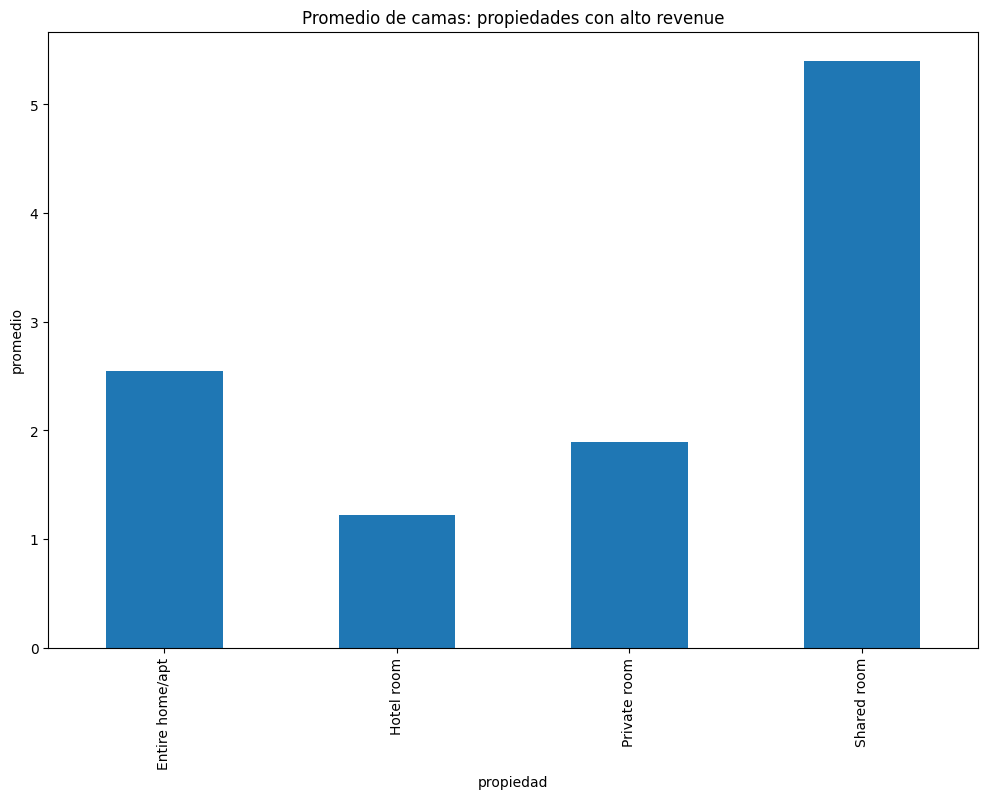

In [520]:
#barrios_df.groupby('room_type')['beds'].mean().plot.bar()

plt.figure(figsize=(12, 8))
ax = barrios_df.groupby('room_type')['beds'].mean().plot.bar()
ax.set_title("Promedio de camas: propiedades con alto revenue")
ax.set_xlabel("propiedad")
ax.set_ylabel("promedio")

plt.show()

In [521]:
barrios_df['price'].describe(percentiles= [.1,.25,.5,.75,.9,.95])

count     302.000000
mean      222.572848
std       204.476123
min        86.000000
10%       101.100000
25%       124.250000
50%       177.500000
75%       250.000000
90%       379.800000
95%       500.000000
max      2310.000000
Name: price, dtype: float64

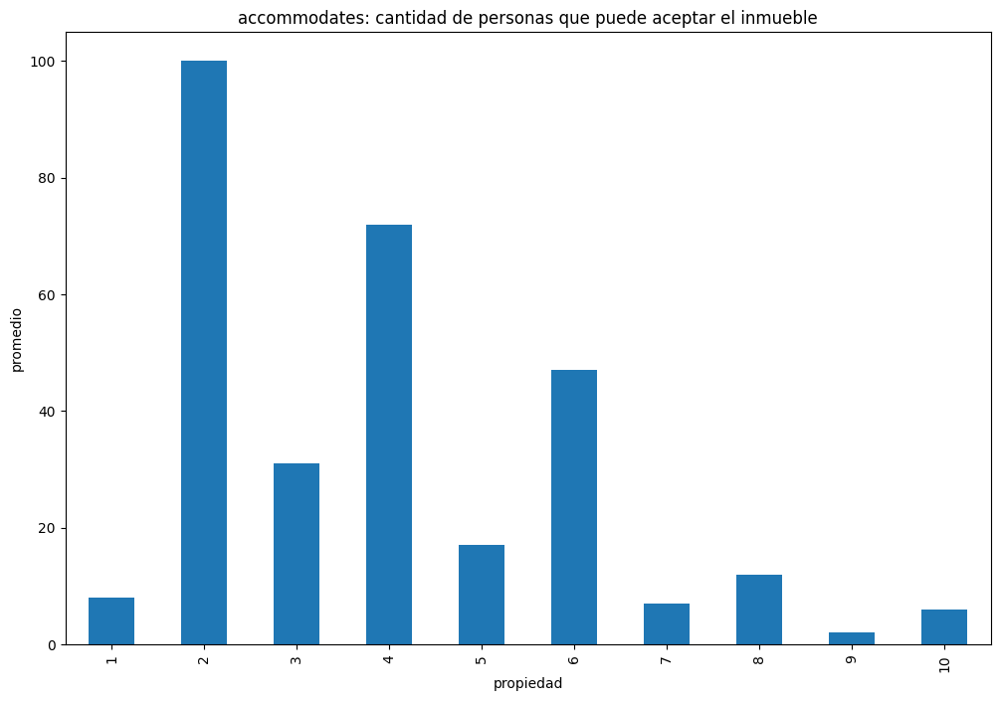

In [522]:
plt.figure(figsize=(12, 8))
ax = barrios_df.groupby('accommodates')['accommodates'].count().plot.bar()
ax.set_title("accommodates: cantidad de personas que puede aceptar el inmueble con alto revenue")
ax.set_xlabel("propiedad")
ax.set_ylabel("promedio")

plt.show()

In [523]:
barrios_df.columns.to_list()

['name',
 'host_since',
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate',
 'host_is_superhost',
 'host_total_listings_count',
 'host_verifications',
 'host_has_profile_pic',
 'host_identity_verified',
 'neighbourhood_cleansed',
 'neighbourhood_group_cleansed',
 'latitude',
 'longitude',
 'property_type',
 'room_type',
 'accommodates',
 'bathrooms_text',
 'beds',
 'price',
 'minimum_nights',
 'maximum_nights',
 'minimum_minimum_nights',
 'maximum_minimum_nights',
 'minimum_maximum_nights',
 'maximum_maximum_nights',
 'minimum_nights_avg_ntm',
 'maximum_nights_avg_ntm',
 'has_availability',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'number_of_reviews_l30d',
 'first_review',
 'last_review',
 'review_scores_rating',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_value',
 'i